In [1]:
import os
import re 
import pickle
import math
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import load_img, img_to_array
import tensorflow.image as tfi
from tqdm import tqdm
from tensorflow.keras.utils import load_img, img_to_array
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob
from keras.callbacks import ModelCheckpoint

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

# 1. Data

In [2]:
DIR_PATH = '/Users/hojae/Desktop/archive/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images'

In [3]:
with open('./test_files.pickle', 'rb') as f:
    test_files = pickle.load(f)

print(test_files)

['night ride (18)', 'Screenshot (410)', 'night ride (74)', 'Screenshot (416)', 'night ride (80)', 'Screenshot (441)', 'Screenshot (434)', 'night ride (57)', 'Screenshot (375)', 'night ride (10)', 'Screenshot (323)', 'Screenshot (436)', 'Screenshot (406)', 'Screenshot (357)', 'Screenshot (427)', 'night ride (91)', 'night ride (36)', 'night ride (98)', 'Screenshot (381)', 'night ride (7)', 'Screenshot (414)', 'night ride (27)', 'night ride (20)', 'Screenshot (393)', 'Screenshot (312)', 'night ride (50)', 'night ride (25)', 'night ride (11)', 'Screenshot (319)', 'night ride (49)']


In [4]:
def build_augmentation(is_train=True):
    if is_train:
        return Compose([
            HorizontalFlip(p=0.5),   
                    RandomSizedCrop(        
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=448,
                        width=448,
                        p=0.5
                        ),
                    Resize(              
                        width=448,
                        height=448
                        )
                    ])
    return Compose([ 
                Resize(
                    width=448,
                    height=448
                    )
                ])

In [5]:
class RandomGenerator(tf.keras.utils.Sequence):
    def __init__(self, 
               dir_path, test_files,
               batch_size=4,
               img_size=(448, 448, 3),
               output_size=(448, 448),
               is_train=True,
               augmentation=None):
        self.dir_path = dir_path
        self.test_files = test_files
        self.batch_size = batch_size
        self.is_train = is_train
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size
        self.color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
        self.data = self.load_dataset()
        
    # Load Dataset 
    # Number of Validation dataset or Test dataset = 30
    def load_dataset(self):
        input_images = []
        label_images= []

        file_list = os.listdir(self.dir_path)

        for file in file_list:
            # if file path name contains a test_file, skip
            if any(test_file in file for test_file in test_files):
                continue
            elif file.endswith(').png') or file.endswith('.png.png'):
                input_images.append(os.path.join(DIR_PATH, file))
            elif file.endswith('.png___fuse.png'):
                label_images.append(os.path.join(DIR_PATH, file))
        
        input_images.sort()
        label_images.sort()
        
        assert len(input_images) == len(label_images)
        
        data = [_ for _ in zip (input_images, label_images)]
        
        if self.is_train:
            return data[:-30]
        return data[-30:]
    
    # Retrieve Data length
    def __len__(self):
        return math.ceil(len(self.data) / self.batch_size)
    
    
    # Retrieve one batch augmented item set
    def __getitem__(self, index):
        batch_data = self.data[
            index*self.batch_size:
            (index + 1)*self.batch_size
        ]
        
        # setup dimensions
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
        
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = img_to_array(load_img(output_path, color_mode = 'grayscale'))
            _output = _output.astype('uint8')
                
            for unique_value in self.color_to_label:
                _output[_output == unique_value] = self.color_to_label[unique_value]
            
            data = {
              "image": _input,
              "mask": _output,
            }
            augmented = self.augmentation(**data)
            
            # Convert input image pixels value to 0~1
            # Because augmented["mask"] value consists of 0 value or 1 value
            inputs[i] = augmented["image"][:,:,:3]/255
            outputs[i] = np.squeeze(augmented["mask"], axis=-1)
            
        return inputs, outputs
    
    # Randomly shuffle the dataset
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        return self.indexes

In [31]:
class TestGenerator(tf.keras.utils.Sequence):
    def __init__(self, 
               dir_path, test_files,
               batch_size=4,
               img_size=(448, 448, 3),
               output_size=(448, 448),
               is_train=True,
               augmentation=None):
        self.dir_path = dir_path
        self.test_files = test_files
        self.batch_size = batch_size
        self.is_train = is_train
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size
        self.color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
        self.data = self.load_dataset()
        
    # Load Dataset 
    # Number of Validation dataset or Test dataset = 30
    def load_dataset(self):
        input_images = []
        label_images= []
        
        base_dir = '/Users/hojae/Desktop/archive/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/'     
        for file in test_files:
            input_path = base_dir + file + ".png"
            label_path = base_dir + file + ".png___fuse.png"
            input_images.append(input_path)
            label_images.append(label_path)
            
        
        print(len(input_images))
        print(len(label_images))
        data = [_ for _ in zip (input_images, label_images)]
        
        if self.is_train:
            return data[:-30]
        return data
    
    # Retrieve Data length
    def __len__(self):
        return math.ceil(len(self.data) / self.batch_size)
    
    
    # Retrieve one batch augmented item set
    def __getitem__(self, index):
        batch_data = self.data[
            index*self.batch_size:
            (index + 1)*self.batch_size
        ]
        
        # setup dimensions
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
        
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = img_to_array(load_img(output_path, color_mode = 'grayscale'))
            _output = _output.astype('uint8')
                
            for unique_value in self.color_to_label:
                _output[_output == unique_value] = self.color_to_label[unique_value]
            
            data = {
              "image": _input,
              "mask": _output,
            }
            augmented = self.augmentation(**data)
            
            # Convert input image pixels value to 0~1
            # Because augmented["mask"] value consists of 0 value or 1 value
            inputs[i] = augmented["image"][:,:,:3]/255
            outputs[i] = np.squeeze(augmented["mask"], axis=-1)
            
        return inputs, outputs
    
    # Randomly shuffle the dataset
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        return self.indexes

In [6]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = RandomGenerator(
    DIR_PATH, test_files,
    augmentation=augmentation,
)

test_generator = RandomGenerator(
    DIR_PATH, test_files,
    augmentation=test_preproc,
    is_train=False
)

In [32]:
real_test_generator = TestGenerator(
    DIR_PATH, test_files,
    augmentation=test_preproc,
    is_train=False
)

30
30


# 2. Model
## 2.1 Build Model

In [7]:
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, Add, GlobalAveragePooling2D
from tensorflow.keras.layers import Activation, BatchNormalization, Concatenate, SeparableConv2D, UpSampling2D
from tensorflow.keras.layers import Input, Conv2D

In [8]:
def conv_block_for_UNet(inputs, filter_size):
    x = Conv2D(filter_size, 3, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(filter_size, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

In [9]:
def create_nest_block(nest_blocks, index):
    layers = [64, 128, 256, 512]
    nest_block = []

    last_index = len(nest_blocks[index]) - 1
    for i in range(0, last_index):
        up = Conv2DTranspose(layers[i], (2, 2), strides=2, padding='same')(nest_blocks[index][i + 1])
        
        concat = up  # Initialize concat with the up tensor
        for j in range(index + 1):
            concat = Concatenate()([concat, nest_blocks[j][i]])
        concat = conv_block_for_UNet(concat, up.shape[-1])
        nest_block.append(concat)
        
    nest_blocks.append(nest_block)

In [10]:
def build_UNetpp_model(input_shape=(448, 448, 3)):
    min_filter_size = 64
    max_filter_size = 512
    
    encode_blocks = []
    
    inputs = tf.keras.layers.Input(shape=input_shape)
    x = inputs
    
    # Encoder
    for i in range(5):
        filter_size = min_filter_size * (2**i)
        x = conv_block_for_UNet(x, filter_size)
        if i != 4:
            encode_blocks.append(x)
            x = MaxPooling2D((2,2))(x)
        else:
            encode_blocks.append(x)
        
            
    nest_blocks = []
    nest_blocks.append(encode_blocks)
    
    # Nest Calculate
    for i in range(4):
        create_nest_block(nest_blocks, i)
    
    
    x = Conv2D(32, 3, padding='same')(nest_blocks[4][0])
    outputs = Conv2D(6, 1, padding='same', activation='softmax')(x)
    
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

In [11]:
UNetpp = build_UNetpp_model()
UNetpp.summary()

2023-11-22 04:32:26.511714: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2 Pro
2023-11-22 04:32:26.511752: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-11-22 04:32:26.511758: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-11-22 04:32:26.512110: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-11-22 04:32:26.512143: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 448, 448, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 448, 448, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 448, 448, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 448, 448, 64)         0         ['batch_normalization[0][0

## 2.2 Train Model

In [12]:
from keras.callbacks import Callback
import os

class SaveModelEveryEpoch(Callback):
    def __init__(self, save_path, first_epoch=1):
        super(SaveModelEveryEpoch, self).__init__()
        self.save_path = save_path # Path where you want to save the models
        self.first_epoch = first_epoch

    def on_epoch_end(self, epoch, logs=None):
        file_name = "{}--{:.4f}-{:.4f}-{:.4f}-{:.4f}.h5".format(self.first_epoch + epoch, logs['loss'], logs['accuracy'],logs['val_loss'],logs['val_accuracy'])
        model_save_path = os.path.join(self.save_path, file_name)

        self.model.save(model_save_path)
        # print(f'Model saved to {model_save_path}')

    def get_config(self):
        config = super(SaveModelEveryEpoch, self).get_config()
        config.update({'save_path': self.save_path, 'first_epoch': self.first_epoch})
        return config

In [13]:
UNetpp_model_path = './model'

In [4]:
model_path = './model/92--0.5978-0.7916-0.8924-0.7288.h5'

UNetpp = tf.keras.models.load_model(model_path)

2023-11-22 06:40:02.315913: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2 Pro
2023-11-22 06:40:02.315950: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-11-22 06:40:02.315954: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-11-22 06:40:02.316001: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-11-22 06:40:02.316021: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [ ]:
model_checkpoint_callback = SaveModelEveryEpoch(UNetpp_model_path, 100)

callbacks = [model_checkpoint_callback]

UNetpp.compile(optimizer=Adam(1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = UNetpp.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=100,
     callbacks=callbacks, 
 )

Epoch 1/100


2023-11-22 04:49:48.922479: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


35/35 [==============================] - ETA: 0s - loss: 0.6755 - accuracy: 0.7731

2023-11-22 04:53:09.782672: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


35/35 [==============================] - 211s 6s/step - loss: 0.6755 - accuracy: 0.7731 - val_loss: 0.8421 - val_accuracy: 0.7170
Epoch 2/100
35/35 [==============================] - 195s 6s/step - loss: 0.6202 - accuracy: 0.7808 - val_loss: 0.9659 - val_accuracy: 0.7013
Epoch 3/100
35/35 [==============================] - 196s 6s/step - loss: 0.7204 - accuracy: 0.7445 - val_loss: 0.9034 - val_accuracy: 0.7546
Epoch 4/100
35/35 [==============================] - 197s 6s/step - loss: 0.6867 - accuracy: 0.7576 - val_loss: 1.0672 - val_accuracy: 0.6825
Epoch 5/100
35/35 [==============================] - 200s 6s/step - loss: 0.6933 - accuracy: 0.7605 - val_loss: 0.8673 - val_accuracy: 0.6850
Epoch 6/100
35/35 [==============================] - 204s 6s/step - loss: 0.6651 - accuracy: 0.7652 - val_loss: 1.0559 - val_accuracy: 0.6957
Epoch 7/100
35/35 [==============================] - 205s 6s/step - loss: 0.6267 - accuracy: 0.7810 - val_loss: 0.7656 - val_accuracy: 0.7175
Epoch 8/100
35/35 

<Figure size 640x480 with 0 Axes>

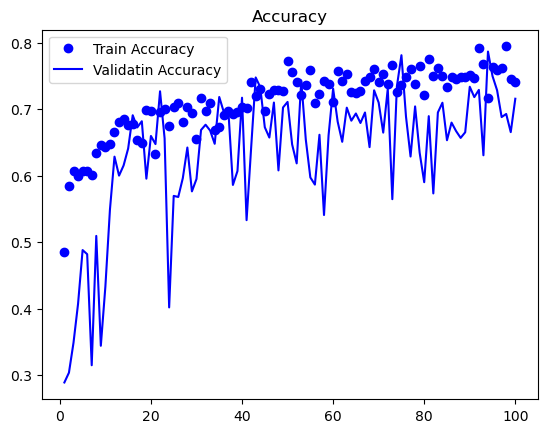

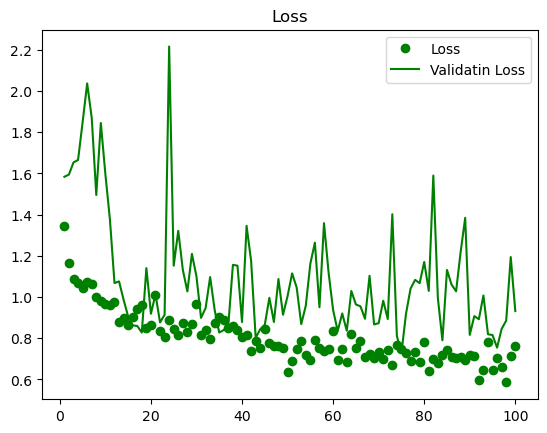

<Figure size 640x480 with 0 Axes>

In [18]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss =  history.history["val_loss"]
                 
epochs = range(1, 101)                           
                            
plt.plot(epochs, accuracy, "bo", label="Train Accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validatin Accuracy")
plt.title("Accuracy")
plt.legend()
plt.figure()                            
                            
plt.plot(epochs, loss, "go", label="Loss")
plt.plot(epochs, val_loss, "g", label="Validatin Loss")
plt.title("Loss")
plt.legend()
plt.figure()  

In [20]:
import os
import json

history_path = './history/history_Unet_plusplus.json'

with open(history_path, 'w') as json_file:
    json.dump(history.history, json_file)

In [4]:
model_path = './model/92--0.5978-0.7916-0.8924-0.7288.h5'

UNetpp = tf.keras.models.load_model(model_path)

2023-11-22 06:37:34.808960: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2 Pro
2023-11-22 06:37:34.808997: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-11-22 06:37:34.809000: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-11-22 06:37:34.809041: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-11-22 06:37:34.809059: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [33]:
evaluation = UNetpp.evaluate(
    real_test_generator,
    steps=len(real_test_generator)
)

# Print the evaluation results
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

8/8 [==============================] - 7s 851ms/step - loss: 1.1095 - accuracy: 0.6652
Test Loss: 1.1094930171966553
Test Accuracy: 0.6652396321296692


In [5]:
predictions = UNetpp.predict(real_test_generator, steps=len(real_test_generator))

NameError: name 'UNetpp' is not defined

In [8]:
test_input_images_path = []
test_label_images_path = []

base_dir = '/Users/hojae/Desktop/archive/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/'       
for file in test_files:
    input_path = base_dir + file + ".png"
    label_path = base_dir + file + ".png___fuse.png"
    test_input_images_path.append(input_path)
    test_label_images_path.append(label_path)

In [41]:
import cv2
def compare_org_gt_pm(model, preproc, prediction, image_path, label_path, index):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    origin_img = cv2.resize(origin_img, (448, 448))
    
    color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
    
    ground_truth = img_to_array(load_img(label_path, target_size = (448,448), color_mode = 'grayscale'))
    ground_truth = ground_truth.astype('uint8')
    ground_truth = ground_truth[:,:,0]
    
    for unique_value in color_to_label:
        ground_truth[ground_truth == unique_value] = color_to_label[unique_value]
    
    pred_mask = np.argmax(prediction, axis=-1)
    
    plt.figure(figsize=(12, 4))
    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(origin_img)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(ground_truth)
    plt.title("Ground Truth Mask")
    plt.axis('off')
    
    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask)
    plt.title("Predicted Mask")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

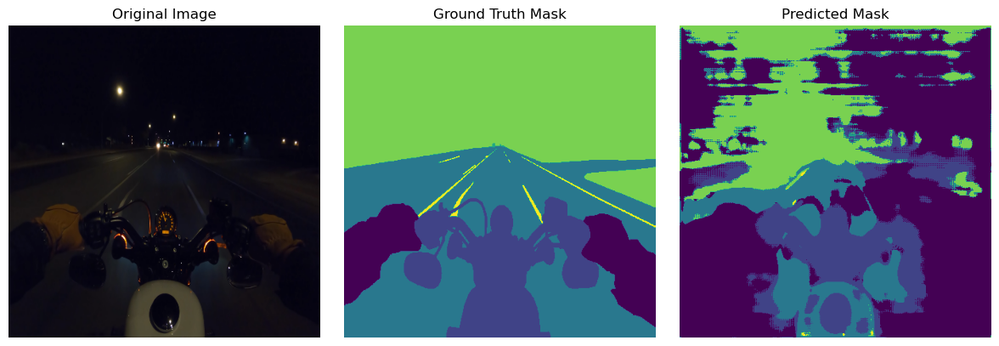

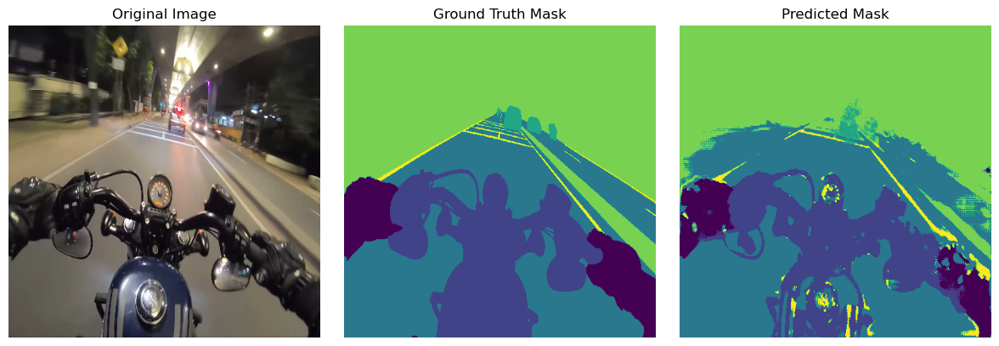

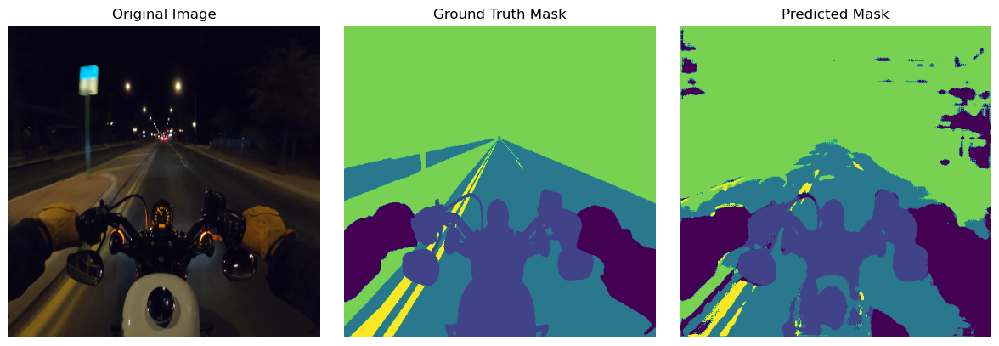

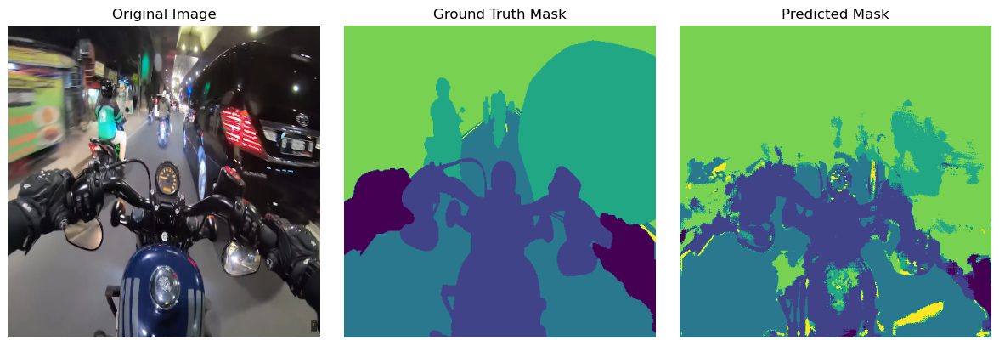

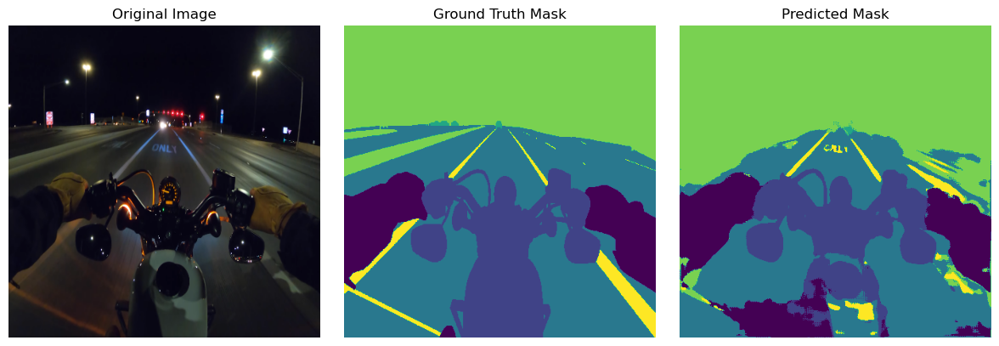

...

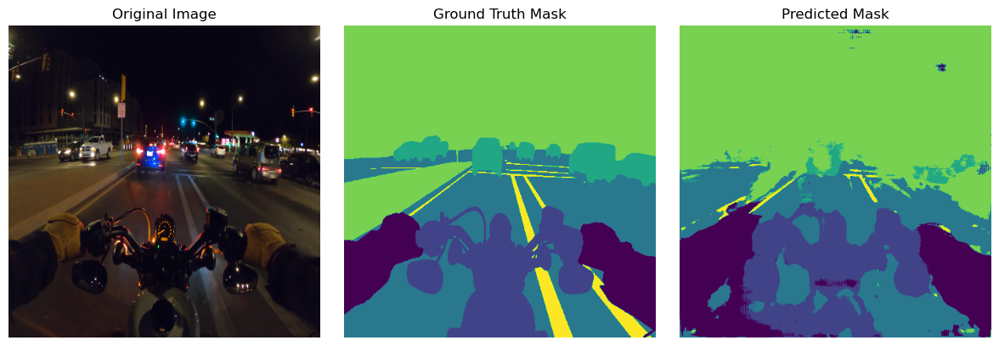

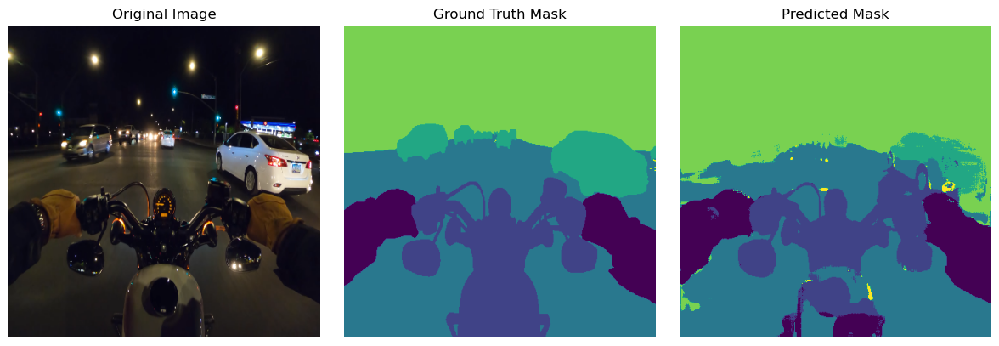

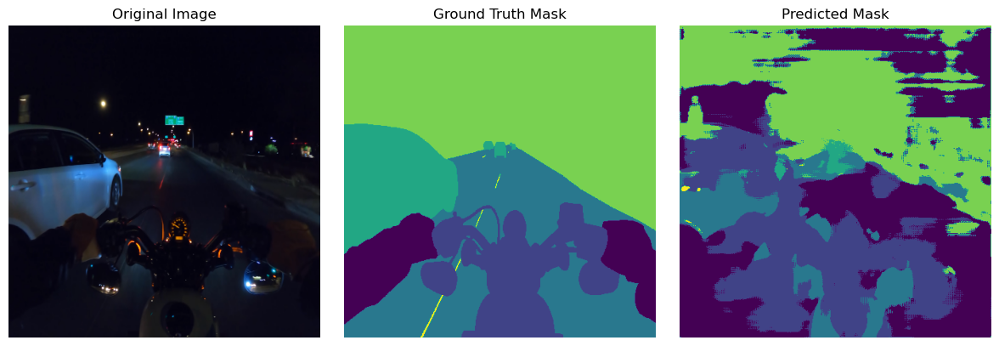

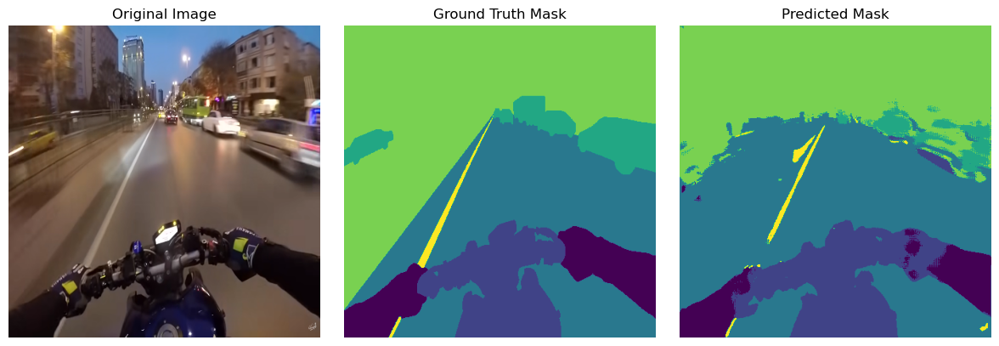

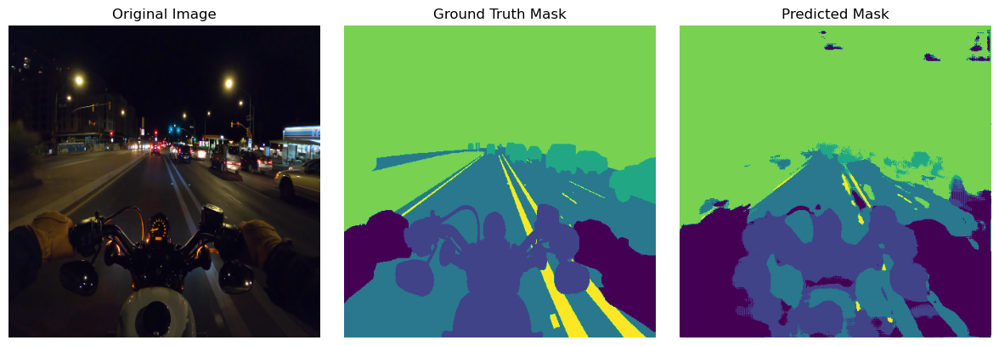

In [42]:
for i in range(30):
    compare_org_gt_pm(
        UNetpp,
        test_preproc,
        prediction = predictions[i],
        image_path = test_input_images_path[i],
        label_path = test_label_images_path[i],
        index=i
    )

In [87]:
def get_prediction_target_not_show_no_threshold(model, preproc, image_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    
    processed = preproc(**data)
    processed["image"] = processed["image"][:,:,:3]
    
    
    output = model(np.expand_dims(processed["image"]/255, axis=0))
    #print(output)
    output = np.argmax(output, axis=-1).astype(np.uint8)
    #print(output)
    #print(np.unique(output))
    prediction = np.squeeze(output)
    
    color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
    target = img_to_array(load_img(label_path, target_size = (448,448), color_mode = 'grayscale'))
    target = target.astype('uint8')
    
    for label in color_to_label:
        target[target == label] = color_to_label[label]
        
    target = np.squeeze(target)
    unique_values, counts = np.unique(target, return_counts=True)
    print("Unique values in target:", unique_values)
    print("Counts of unique values:", counts)
    
    return prediction, target

In [88]:
predictions = []
targets = []

for i in range(30):
        p, t = get_prediction_target_not_show_no_threshold( 
                UNetpp,
                test_preproc,
                image_path=test_input_images_path[i],
                label_path=test_label_images_path[i],
            )
        predictions.append(p)
        targets.append(t)

Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [18571 29043 63269    34 88382  1405]
Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [14597 39099 57903  1473 85715  1917]
Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [19255 29576 49138    32 98803  3900]
Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [15844 41400 46370 47721 49141   228]
Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [19943 34146 68512   301 72271  5531]
Unique values in target: [0 1 2 3 4]
Counts of unique values: [16595 36387 54836 40062 52824]
Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [16480 46899 47757 30742 58017   809]
Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [15362 26405 62376    64 95147  1350]
Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [16848 32729 38930 11693 95138  5366]
Unique values in target: [0 1 2 3 4 5]
Counts of unique values: [17640 22107 57621  7656 9

In [99]:
def calculate_iou_score(target, prediction):
    total_area = 448 * 448
    
    IoUs = []
    areas = []
    
    #print(np.unique(prediction))
    #print(np.unique(target))

    
    for class_i in range(6):
        pred = np.where(prediction==class_i, True, False)
        tar = np.where(target==class_i, True, False)
        
        #print(pred)
        #print(tar.shape)
        #print(np.unique(tar))
        
        intersection = np.logical_and(tar, pred)
        union = np.logical_or(tar, pred)
        iou_score = np.sum(intersection) / np.sum(union)
        if np.isnan(iou_score):
            iou_score = 0 
        
        #print(iou_score)
        IoUs.append(iou_score)
        #print(pred.sum())
        # 해당 클래스가 차지하는 영역 구하기
        area = pred.sum() / total_area
        areas.append(area)
        #print(area)
        
    return IoUs, areas

In [102]:
for i in range(30):
    IoUs, areas = calculate_iou_score(targets[i], predictions[i])
    print (IoUs)

[0.17941476197408648, 0.4552977328268286, 0.24553571428571427, 0.0, 0.39619493357399205, 0.03032300593276203]
[0.6778804018067822, 0.7495842020192556, 0.7008117612840107, 0.32018464120856066, 0.8505072317070428, 0.18416523235800344]
[0.5976443403190089, 0.8034597682907475, 0.5391842692481922, 0.2765957446808511, 0.7972316881023048, 0.41911305434103685]
[0.15297273691434277, 0.6507550230874828, 0.7197377976531744, 0.17268116364484346, 0.47012572458091806, 0.003899902502437439]
[0.6611680143755615, 0.7335026782262963, 0.6560931566508219, 0.017777777777777778, 0.8407498778132055, 0.14022466237536288]
[0.6547870217254946, 0.8173610088816919, 0.6623563218390804, 0.20315505027144143, 0.6783576590436053, 0.0]
[0.2651807556401196, 0.602245309961101, 0.6682450788447237, 0.012230845891341768, 0.5740543735224586, 0.118]
[0.12720151694557377, 0.3964134551124972, 0.003317998942087294, 0.0, 0.44067479107910373, 0.0]
[0.366399018623843, 0.1440691489361702, 0.010891292091640614, 0.017937567945333126, 

In [103]:
# 전체 계산 결과
total_IoUs, total_areas = [], []

for i in range(30):
    IoUs, areas = calculate_iou_score(targets[i], predictions[i])
    
    total_IoUs.append(IoUs)
    total_areas.append(areas)

In [104]:
# 클래스별 MIoU 구하기
MIoUs = []

for i in range(6):
    MIoUs.append(sum([iou[i] for iou in total_IoUs]) / len(total_IoUs))

In [105]:
MIoUs

[0.4070383140412093,
 0.54616317713425,
 0.36941804881693735,
 0.12182171128001679,
 0.6258322658330451,
 0.1309762212491148]

In [106]:
# MIoU의 평균

sum([sum(iou) for iou in total_IoUs]) / (len(total_IoUs) * 6)

0.3668749563924289

In [107]:
# IoU의 가중평균의 평균

avgIoUs = []

for IoUs, areas in zip(total_IoUs, total_areas):
    avgIoUs.append(sum([iou * area for iou, area in zip(IoUs, areas)]))
    
sum(avgIoUs) / len(avgIoUs)

0.5339545042925057

In [5]:
def normalize_and_resize_img(input_path, image_path):
    input_image = img_to_array(load_img(input_path, target_size = (448,448)))
    input_image = input_image[:,:,:3]
    #print(input_image.shape)
    input_image = tf.cast(input_image, tf.float32)/255.
    
    color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
    ground_truth = img_to_array(load_img(label_path, target_size = (448,448), color_mode = 'grayscale'))
    ground_truth = ground_truth[:,:,0]
    for unique_value in color_to_label:
        ground_truth[ground_truth == unique_value] = color_to_label[unique_value]
    #print(ground_truth.shape)
    ground_truth = tf.cast(ground_truth, tf.float32)/255.

    return input_image, ground_truth

In [6]:
import cv2

def generate_grad_cam(model, activation_layer, input_path, image_path):
    list_name = ["Rider", "My bike", "Road", "Movable", "Undirvable", "Lanemark"]
    width = 448
    height = 448
    
    img_tensor, class_idx = normalize_and_resize_img(input_path, image_path)
    
    grad_model = tf.keras.models.Model([model.inputs], 
                                       [model.get_layer(activation_layer).output, model.output])
    
    for i in range(6):
        with tf.GradientTape() as tape:
            conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))
            loss = pred[0, :, :, i]
            output = conv_output[0]
        
            grad_val = tape.gradient(loss, conv_output)[0]
    
        weights = np.mean(grad_val, axis=(0, 1))
        grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    
        for k, w in enumerate(weights):
            grad_cam_image += w * output[:, :, k]
        
        grad_cam_image = tf.math.maximum(0, grad_cam_image)
        grad_cam_image /= np.max(grad_cam_image)
        grad_cam_image = grad_cam_image.numpy()
        grad_cam_image = cv2.resize(grad_cam_image, (width, height))
        
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 6, i+1)
        plt.imshow(grad_cam_image)
        plt.title(f"{i}:{[list_name[i]]}")
        plt.axis('off')
        plt.show()
    

=========================0번째 그림===========================


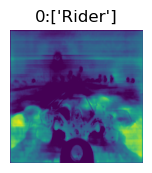

In [ ]:
for i in range(30):
    print(f"========================={i}번째 그림===========================")
    grad_cam_image = generate_grad_cam(UNetpp, 'activation_29', test_input_images_path[i], test_label_images_path[i])